<a href="https://colab.research.google.com/github/Supriya840/Chess-Playing-Robotic-arm-development/blob/main/yolov5_chess_piece.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 29.0 MB/s eta 0:00:00


In [ ]:
!ls /content

sample_data


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Chess Piece Detector.v1-chessv1.yolov5pytorch.zip to Chess Piece Detector.v1-chessv1.yolov5pytorch.zip


In [ ]:
!unzip "Chess Piece Detector.v1-chessv1.yolov5pytorch.zip" -d /content/
!ls /content

Archive:  Chess Piece Detector.v1-chessv1.yolov5pytorch.zip
  inflating: /content/README.dataset.txt  
  inflating: /content/README.roboflow.txt  
  inflating: /content/data.yaml      
   creating: /content/test/
   creating: /content/test/images/
 extracting: /content/test/images/0b47311f426ff926578c9d738d683e76_jpg.rf.ca63fd1423c0be1c65dfd7c6776aa7b9.jpg  
 extracting: /content/test/images/1c0060ef868bdc326ce5e6389cb6732f_jpg.rf.9d7dc15feca55632b2bc3bee70e289bb.jpg  
 extracting: /content/test/images/2f6fb003bb89cd401322a535acb42f65_jpg.rf.5df4fe4244df5b9c1d891b42ac0628ec.jpg  
 extracting: /content/test/images/410993714e325a1de3e394ffe860df3a_jpg.rf.2c7032272fd92573dd7026690131576f.jpg  
 extracting: /content/test/images/4e3117459d759798537eb52cf5bf534d_jpg.rf.79ead4b55a9df7d8a148f0d159bf53c9.jpg  
 extracting: /content/test/images/5a35ba2ec3e0d0b2b12b1758a8ac29aa_jpg.rf.e0c82c197a86a857ac548cf5bc6c1b16.jpg  
 extracting: /content/test/images/654bb8835258b26c466b1c19893df451_jpg.rf.

In [ ]:
!cat /content/data.yaml

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 13
names: ['bishop', 'black-bishop', 'black-king', 'black-knight', 'black-pawn', 'black-queen', 'black-rook', 'white-bishop', 'white-king', 'white-knight', 'white-pawn', 'white-queen', 'white-rook']

roboflow:
  workspace: as-it-is
  project: chess-piece-detector-fh1g5-4jwdt
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/as-it-is/chess-piece-detector-fh1g5-4jwdt/dataset/1

In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 17544, done.
remote: Counting objects: 100% (42/42), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 17544 (delta 25), reused 3 (delta 3), pack-reused 17502 (from 2)
Receiving objects: 100% (17544/17544), 16.66 MiB | 24.51 MiB/s, done.
Resolving deltas: 100% (12022/12022), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 16.5 MB/s eta 0:00:00


In [ ]:
!python train.py --img 640 --batch 16 --epochs 60 --data /content/data.yaml --weights yolov5s.pt --cache

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-08-23 06:17:10.744812: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1755929830.770759    6990 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1755929830.778625    6990 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS wh

In [ ]:
!ls runs/train
!ls runs/train/exp/weights

exp
best.pt  last.pt


In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --source /content/test/images --save-txt --save-conf

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_format=0, save_csv=False, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-425-g85acef3a Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7045186 parameters, 0 gradients, 15.9 GFLOPs
image 1/28 /content/test/images/0b47311f426ff926578c9d738d683e76_jpg.rf.ca63fd1423c0be1c65dfd7c6776aa7b9.jpg: 448x640 1 white-bishop, 35.9ms
image 2/28 /content/test/images/1c0060ef868bdc326ce5e6389cb6732f_jpg.rf.9d7dc15feca55632b2bc3bee70e289bb.jpg: 448x640 1 white-rook, 8.8ms
image 3/28 /content/test/images/2f6f

In [ ]:
!find /content/ -name "*.jpg" -path "*/detect/*" 2>/dev/null

/content/yolov5/runs/detect/exp/b526b661a33ff481231d1342aff2a266_jpg.rf.dd8040d7febb0ea94749a8097a24a366.jpg
/content/yolov5/runs/detect/exp/0b47311f426ff926578c9d738d683e76_jpg.rf.ca63fd1423c0be1c65dfd7c6776aa7b9.jpg
/content/yolov5/runs/detect/exp/5a35ba2ec3e0d0b2b12b1758a8ac29aa_jpg.rf.e0c82c197a86a857ac548cf5bc6c1b16.jpg
/content/yolov5/runs/detect/exp/1c0060ef868bdc326ce5e6389cb6732f_jpg.rf.9d7dc15feca55632b2bc3bee70e289bb.jpg
/content/yolov5/runs/detect/exp/IMG_0170_JPG_jpg.rf.694eb7babd66fbcfcde9c06668c40a55.jpg
/content/yolov5/runs/detect/exp/654bb8835258b26c466b1c19893df451_jpg.rf.ccb5135e46916e59a7b43b828ed3d2e3.jpg
/content/yolov5/runs/detect/exp/749e9074a77f8d34d86e2218f26cdab4_jpg.rf.1acd7a74b2de712d714467107480ac6b.jpg
/content/yolov5/runs/detect/exp/2f6fb003bb89cd401322a535acb42f65_jpg.rf.5df4fe4244df5b9c1d891b42ac0628ec.jpg
/content/yolov5/runs/detect/exp/fdcd6ada676799da8a870f58fdf548db_jpg.rf.b5bfe49419f25bd2872840698332e8ed.jpg
/content/yolov5/runs/detect/exp/73a38a5

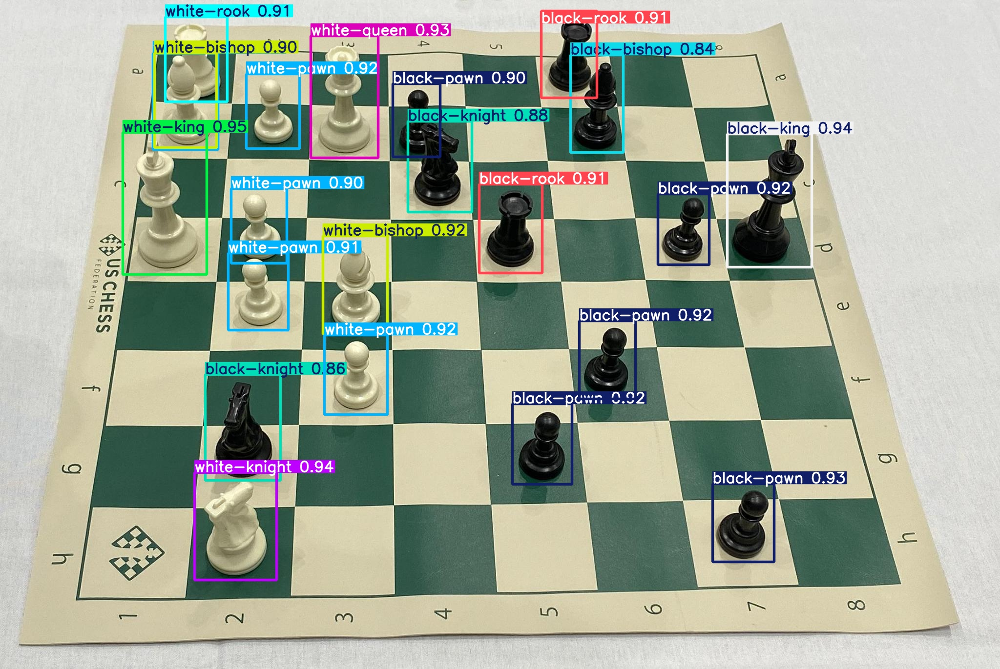

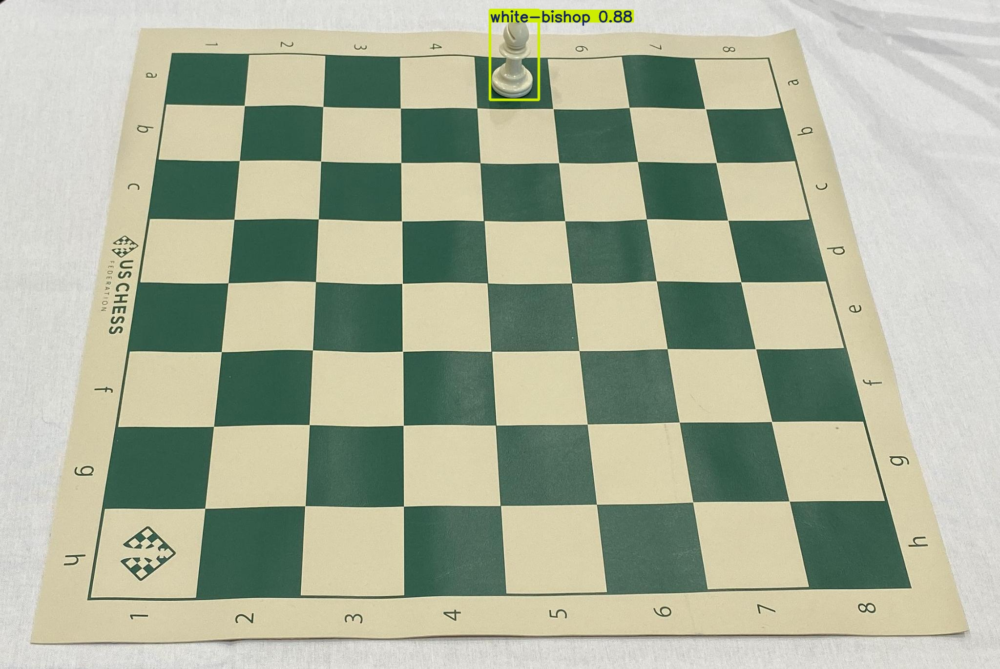

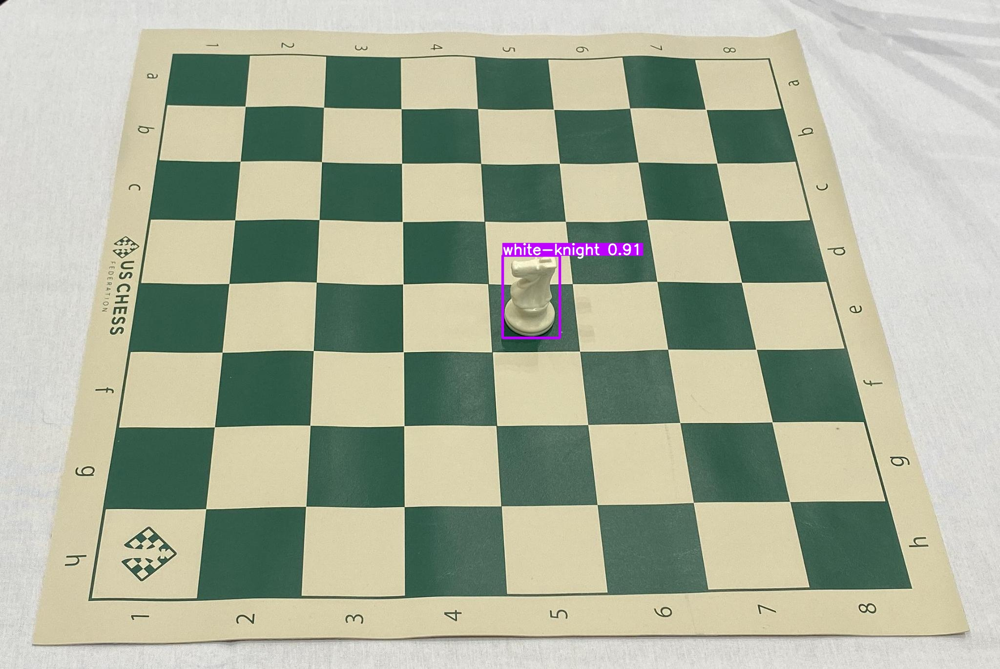

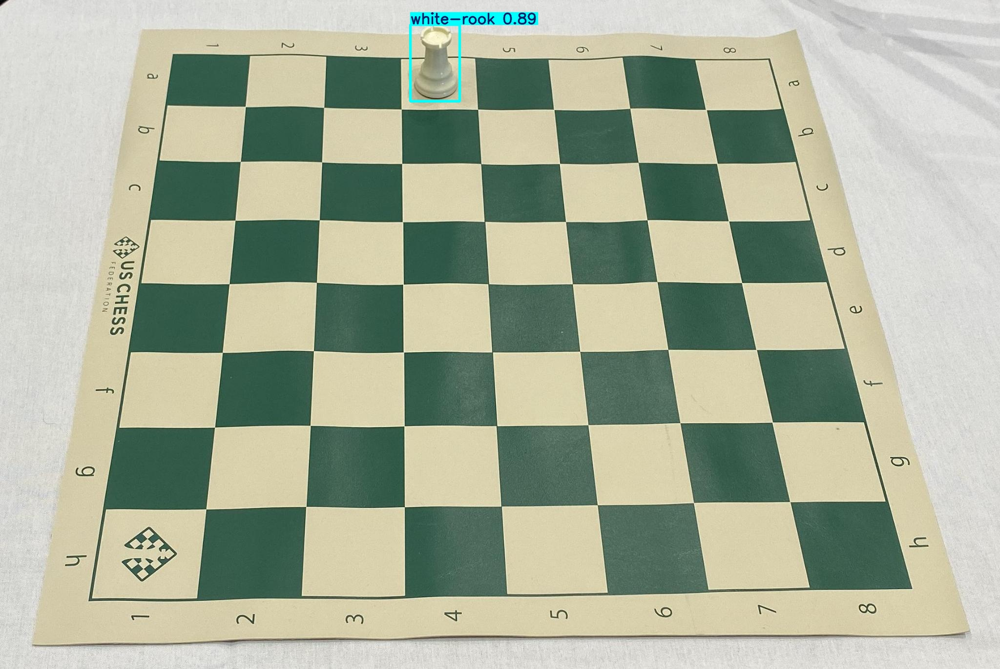

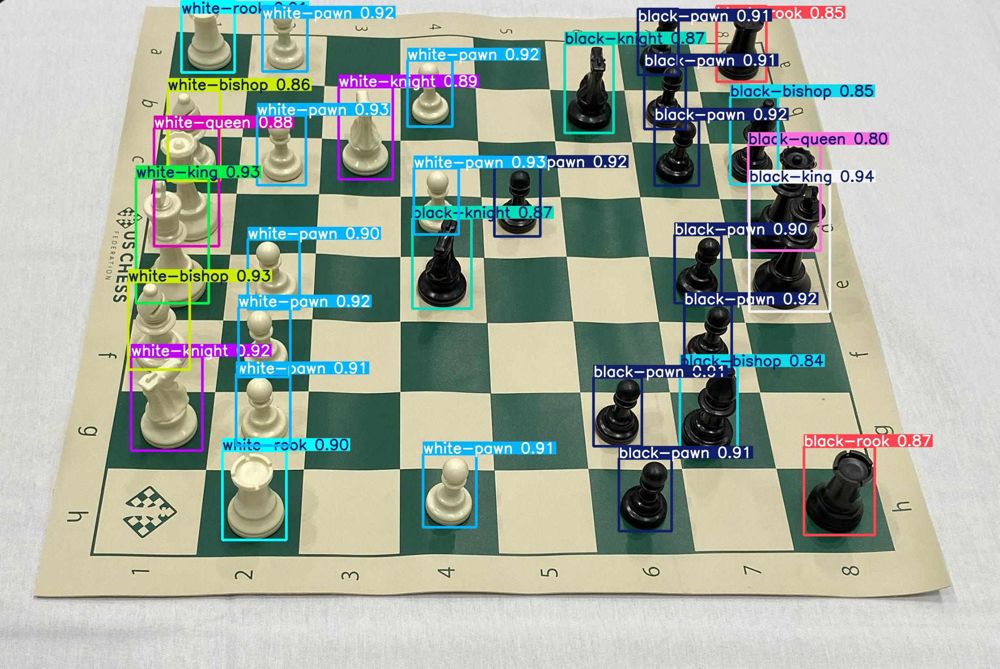

...

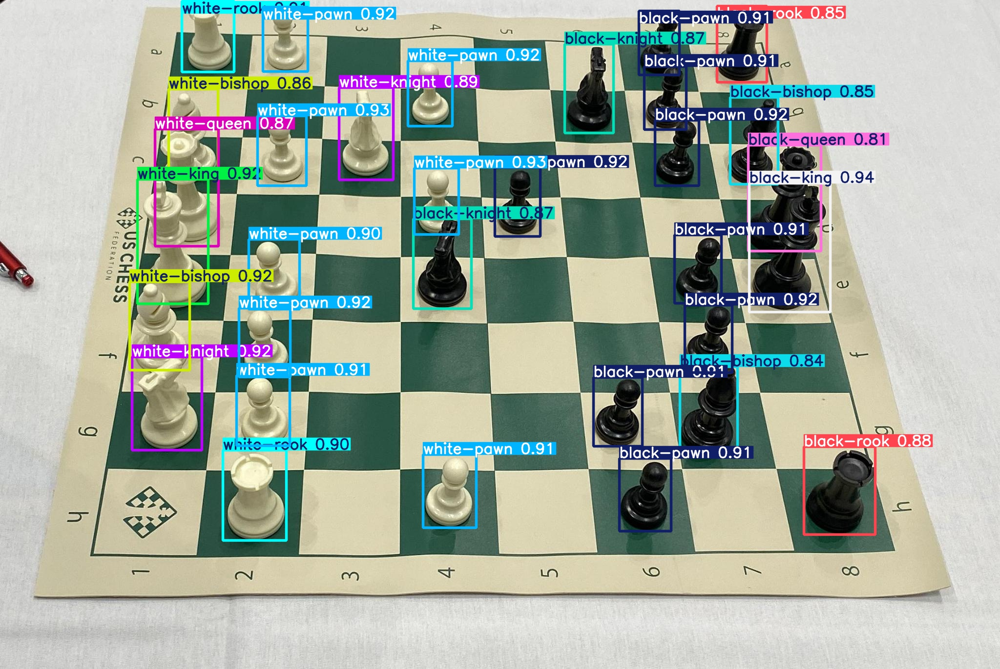

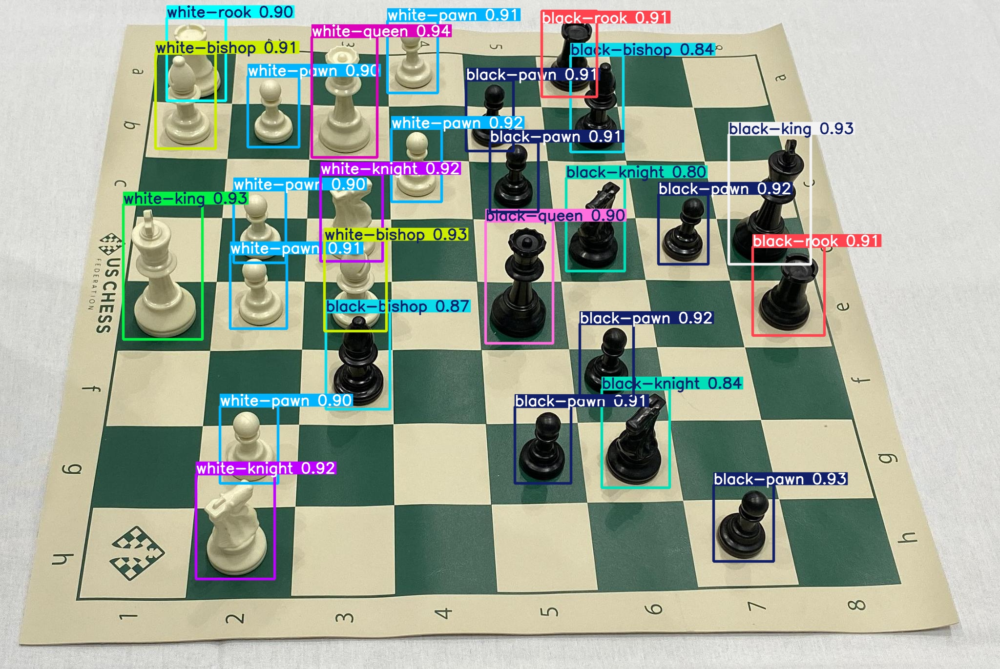

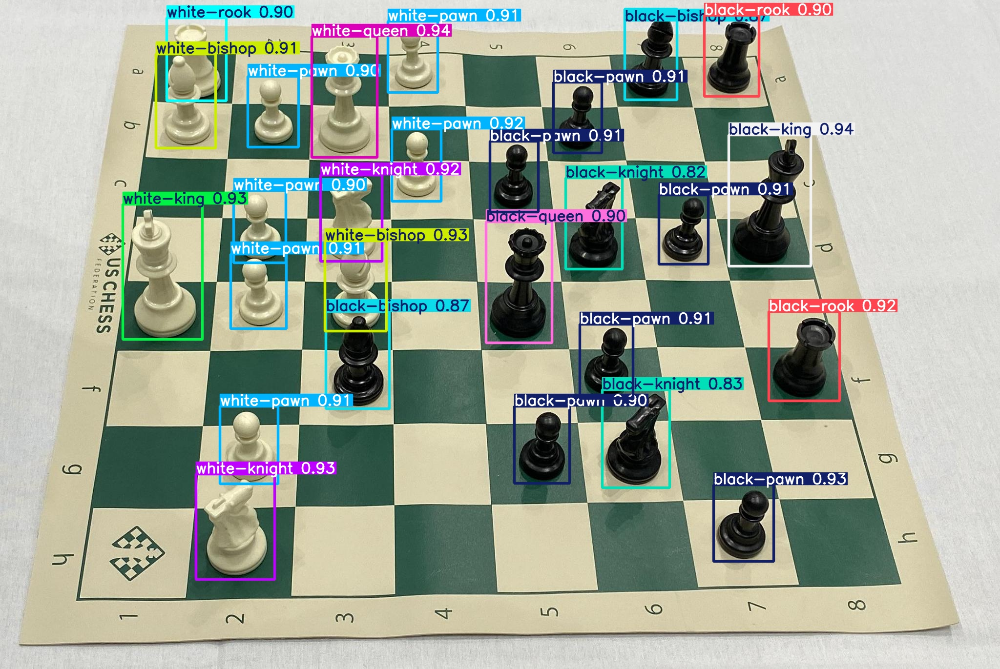

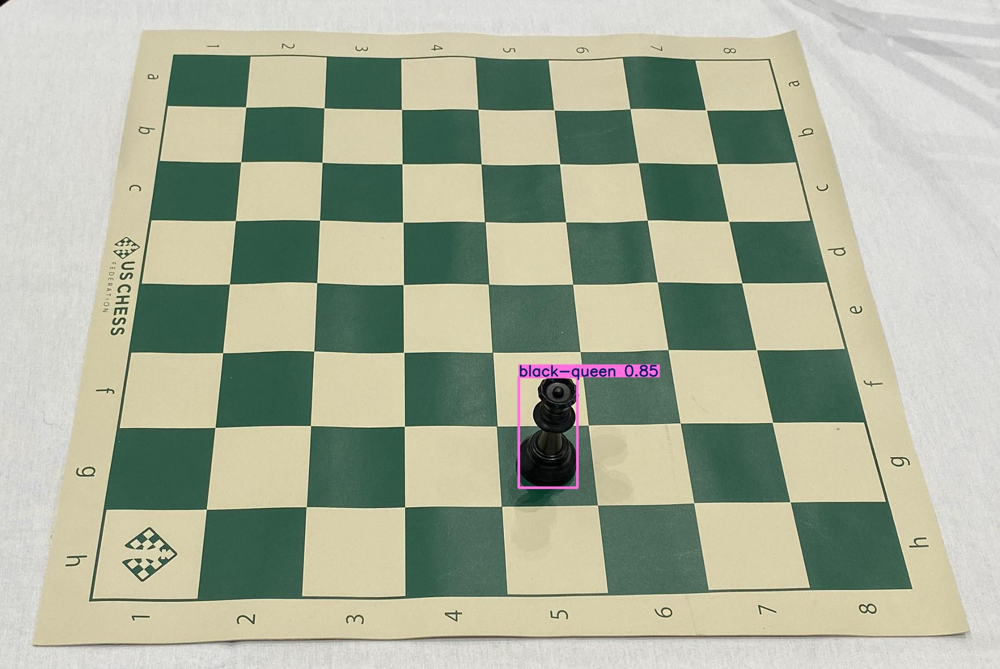

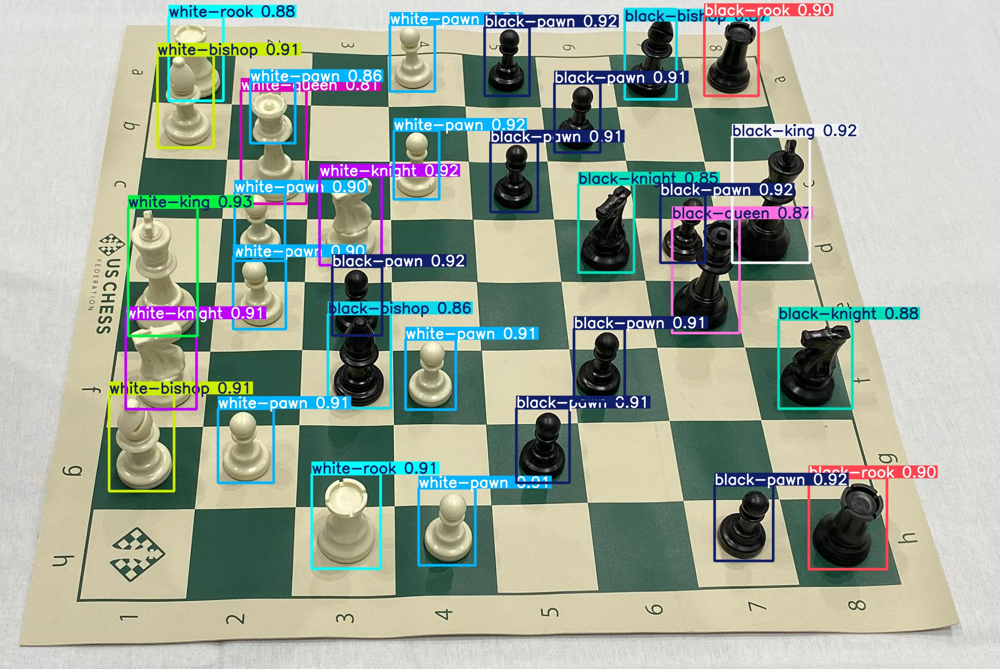

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/content/yolov5/runs/detect/exp/*.jpg')[:20]:
    display(Image(filename=image_path, height=400))
    print('\n')

In [ ]:
# Create "my_model" folder to store model weights and train results
!mkdir /content/my_model

# Copy from the correct YOLOv5 training path (not detect path)
!cp /content/runs/train/exp/weights/best.pt /content/my_model/my_model.pt
!cp -r /content/runs/train/exp /content/my_model/train

# Zip into "my_model.zip"
%cd /content/my_model
!zip /content/my_model.zip my_model.pt
!zip -r /content/my_model.zip train
%cd /content

cp: cannot stat '/content/runs/train/exp/weights/best.pt': No such file or directory
cp: cannot stat '/content/runs/train/exp': No such file or directory
/content/my_model
	zip warning: name not matched: my_model.pt

zip error: Nothing to do! (/content/my_model.zip)
	zip warning: name not matched: train

zip error: Nothing to do! (try: zip -r /content/my_model.zip . -i train)
/content
